In [32]:
%load_ext autoreload
%autoreload 2

import os

subj = "Subj2"

match subj:
    case 'Subj1':
        N_STAGES = 9
    case 'Subj2':
        N_STAGES = 8
    case 'Subj3':
        N_STAGES = 10

exp = "exp_full_flow"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [33]:
import typing

import mne
import umap
import tqdm
import numpy
import pandas
import joblib
import itertools
import IPython.display
import sklearn.metrics
import matplotlib.colors
import sklearn.preprocessing
import sklearn.decomposition
import tqdm.contrib.itertools
import matplotlib.pyplot as plt
import sklearn.cross_decomposition

import SDA.topology
import SDA.analytics
import SDA.clustquality
import SDA.stageprocess

from full_flow.AutoEncoder import AutoEncoder

In [34]:
match subj:
    case 'Subj1':
        QSDA_THRESHOLD = 0.4
    case 'Subj2':
        QSDA_THRESHOLD = 0.28
    case 'Subj3':
        QSDA_THRESHOLD = 0.32
        
UNIQUE_VALUES_THRESHOLD = 200
TRY_NUM_FEATURES = list(range(10, 201, 10))

print(len(TRY_NUM_FEATURES))
print(TRY_NUM_FEATURES)

20
[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200]


In [35]:
def explained_variance(features, reduced):
    pls = sklearn.cross_decomposition.PLSRegression(n_components = reduced.shape[1])
    pls = pls.fit(reduced, features)
    y_pred = pls.predict(reduced)
    return sklearn.metrics.r2_score(features, y_pred, multioutput = "variance_weighted")

### Data

In [36]:
edges_true = numpy.loadtxt(f"{subj}/{exp}/target_edges.txt").astype(numpy.int32)

raw_data = mne.io.read_raw_fif(f"{subj}/src/data_rr_filt-raw.fif").drop_channels(ch_names = [ "A1", "A2" ])
epochs = mne.read_epochs(f"{subj}/src/epochs_filt_rr-epo.fif").drop_channels(ch_names = [ "A1", "A2" ])
if subj == "Subj2": # m8 (artifacts at the end)
    epochs = epochs[:-2]

data = epochs.get_data(copy = True)

Opening raw data file Subj2/src/data_rr_filt-raw.fif...
    Range : 4000 ... 1176000 =      8.000 ...  2352.000 secs
Ready.
Reading d:\TopoEEG\Subj2\src\epochs_filt_rr-epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
2019 matching events found
No baseline correction applied
0 projection items activated


### Features

In [37]:
dissimilarity_folder = f"{subj}/{exp}/features/dissimilarity"
os.makedirs(dissimilarity_folder, exist_ok = True)
dissimilarity_extractor = SDA.topology.DissimilarityFeatureExtractor(n_jobs = -1, folder = dissimilarity_folder)
dissimilarity_features = dissimilarity_extractor.extract(data)

Got features from Subj2/exp_full_flow/features/dissimilarity/features.feather


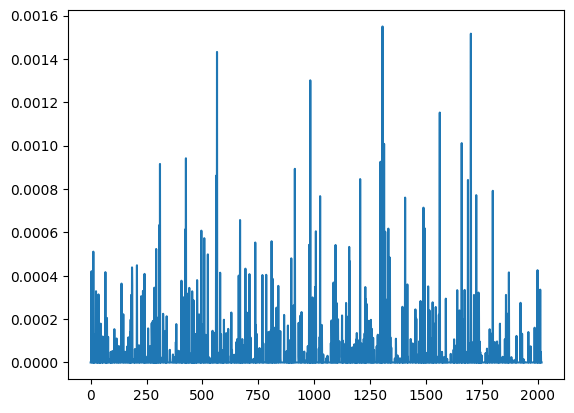

In [38]:
plt.plot(dissimilarity_features["dissim-0 silhouette-1 dim-5 mean"])

In [39]:
point_clouds = dissimilarity_extractor.get_point_clouds(data)
diagrams = dissimilarity_extractor.calculate_persistence(point_clouds)

100%|██████████| 2017/2017 [00:03<00:00, 563.76it/s]


Point clouds: (48408, 38, 38)
Got diagrams from Subj2/exp_full_flow/features/dissimilarity/diagrams.npy


In [29]:
import joblib
import ripser
import tqdm

def process(point_cloud):
    return ripser.ripser(point_cloud, maxdim=5, do_cocycles=True, distance_matrix=True)

ripser_results = joblib.Parallel(n_jobs = -1)(
    joblib.delayed(process)(point_cloud)
    for point_cloud in tqdm.tqdm(point_clouds)
)

100%|██████████| 28320/28320 [1:08:16<00:00,  6.91it/s]


In [30]:
import pickle
with open(f"{subj}_ripser_results.pkl", "wb") as file:
    pickle.dump(ripser_results, file)

In [48]:
def determine_filtering_epsilon(diagrams: numpy.ndarray, percentile: int):
    life = (diagrams[:, :, 1] - diagrams[:, :, 0]).flatten()
    return numpy.percentile(life[life != 0], percentile)

filtering_theshold = determine_filtering_epsilon(diagrams, 10)

In [43]:
dissimilarity_features["dissim-0 silhouette-1 dim-5 mean"].nunique()

480

In [ ]:
dissim0_dim5_diagrams = []
for diagram in diagrams[::24]:
    diagram = diagram[diagram[:, 2] == 5]
    diagram = diagram[diagram[:, 1] - diagram[:, 0] > filtering_theshold]
    dissim0_dim5_diagrams.append(diagram)
len(dissim0_dim5_diagrams)

2017

In [115]:
def show(subj, dissim_num):
    dissimilarity_folder = f"{subj}/{exp}/features/dissimilarity"
    os.makedirs(dissimilarity_folder, exist_ok = True)
    dissimilarity_extractor = SDA.topology.DissimilarityFeatureExtractor(n_jobs = -1, folder = dissimilarity_folder)
    dissimilarity_features = dissimilarity_extractor.extract(None)
    diagrams = dissimilarity_extractor.calculate_persistence(None)

    import pickle
    with open(f"{subj}_ripser_results.pkl", "rb") as file:
        ripser_results = pickle.load(file)

    def determine_filtering_epsilon(diagrams: numpy.ndarray, percentile: int):
        life = (diagrams[:, :, 1] - diagrams[:, :, 0]).flatten()
        return numpy.percentile(life[life != 0], percentile)

    filtering_theshold = determine_filtering_epsilon(diagrams, 10)

    dissim0_dim5_diagrams = []
    for diagram in diagrams[dissim_num::24]:
        diagram = diagram[diagram[:, 2] == 5]
        diagram = diagram[diagram[:, 1] - diagram[:, 0] > filtering_theshold]
        dissim0_dim5_diagrams.append(diagram)
    print(len(dissim0_dim5_diagrams))

    print('Unique dim5 diagrams: ', dissimilarity_features[f"dissim-{dissim_num} silhouette-1 dim-5 mean"].nunique())

    from collections import Counter

    overall_result = []
    def print_acc(acc):
        items = []
        for item in acc:
            items.extend(item)
        # print(Counter(items).most_common(50))

        res = [0 for _ in range(38)]
        for key, value in Counter(items).most_common(50):
            res[key] = value
        overall_result.append(res)

    edges = [0, 372, 542, 646, 994, 1116, 1275, 1795, 2017]
    acc = []
    for i, (diagram, ripser_diag) in enumerate(zip(dissim0_dim5_diagrams, ripser_results[dissim_num::24])):
        if i in edges:
            print_acc(acc)
            acc = []
        dgms = ripser_diag['dgms'][5]
        cocycles = ripser_diag['cocycles'][5]

        res = []
        for point in diagram:
            for dgm, cocycle in zip(dgms, cocycles):
                if dgm[0] == point[0] and dgm[1] == point[1]:
                    res.append(list(numpy.unique(cocycle)))
                    break
            else:
                assert False
        acc.extend(res)
    print_acc(acc)

    import seaborn
    plt.figure(figsize=(15, 3))
    seaborn.heatmap(overall_result, annot=True, fmt="d", cmap="YlGnBu", cbar=True, linewidths=0.5, linecolor='black', xticklabels=raw_data.ch_names)
    plt.xlabel("EEG component")
    plt.ylabel("Functional stage")

Got features from Subj1/exp_full_flow/features/dissimilarity/features.feather
Got diagrams from Subj1/exp_full_flow/features/dissimilarity/diagrams.npy
1046
Unique dim5 diagrams:  35


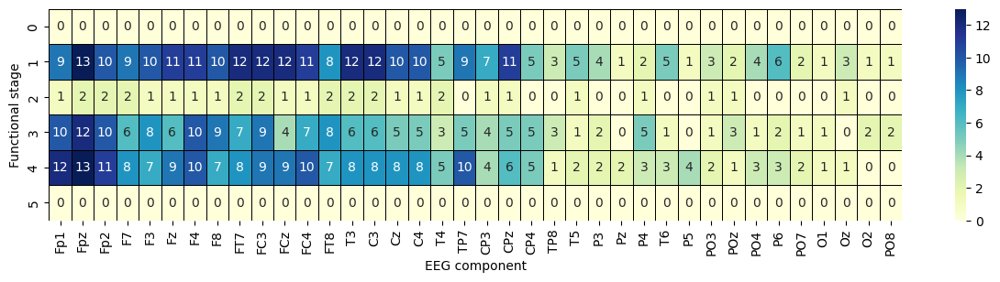

In [116]:
show("Subj1", 0)

Got features from Subj2/exp_full_flow/features/dissimilarity/features.feather
Got diagrams from Subj2/exp_full_flow/features/dissimilarity/diagrams.npy
2017
Unique dim5 diagrams:  391


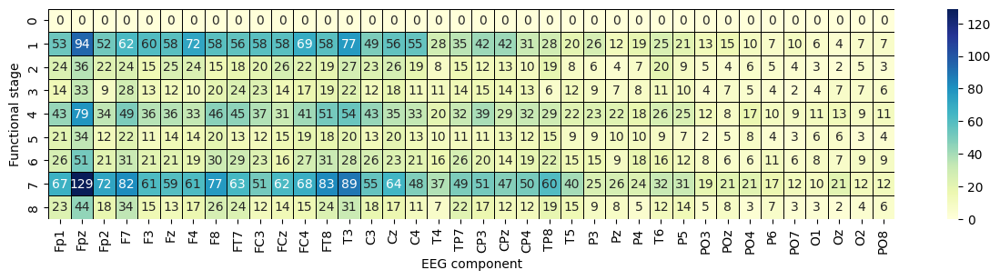

In [122]:
show("Subj2", 23)

Got features from Subj3/exp_full_flow/features/dissimilarity/features.feather
Got diagrams from Subj3/exp_full_flow/features/dissimilarity/diagrams.npy
1180
Unique dim5 diagrams:  164


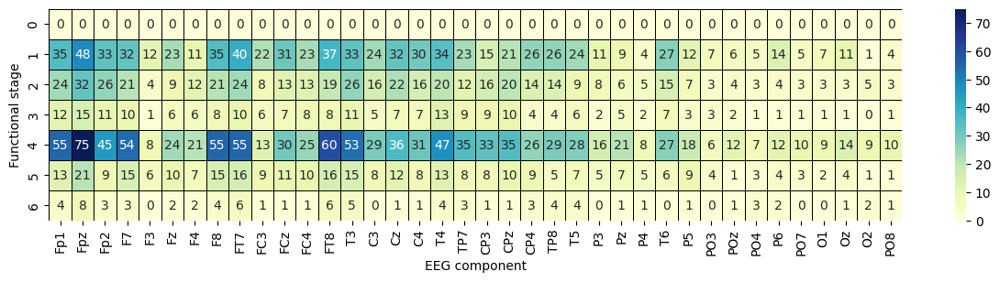

In [113]:
show("Subj3")

In [ ]:
qqq = []
for i, item in enumerate(dissim0_dim5_diagrams):
    if len(item) == 0:
        continue
    for j, other in qqq:
        if item.shape == other.shape and (item == other).all():
            print(i, j)
            break
    else:
        qqq.append((i, item))
len(qqq)

479

In [49]:
useful_cocycles = []
for diag, ripser_diag in zip(diagrams[::24], ripser_results[::24]):
    diag = diag[diag[:, 2] == 5]
    diag = diag[diag[:, 1] - diag[:, 0] > 0]
    if len(diag) == 0:
        continue

    dgms = ripser_diag['dgms'][5]
    cocycles = ripser_diag['cocycles'][5]
    assert len(diag) == len(cocycles), f"{len(diag)}, {len(cocycles)}"
    assert len(diag) == len(dgms), f"{len(diag)}, {len(cocycles)}"

    for point in diag:
        if point[1] - point[0] <= filtering_theshold:
            continue
        for dgm, cocycle in zip(dgms, cocycles):
            if dgm[0] == point[0] and dgm[1] == point[1]:
                useful_cocycles.append(cocycle)
                break
        else:
            print(point)
            print(dgms)
            assert False
len(useful_cocycles)

626

In [46]:
items = []
for cocycle in useful_cocycles:
    items.append(tuple(list(numpy.unique(cocycle))))

Counter(items).most_common(50)

[((1, 7, 16, 23, 28, 31), 2),
 ((0, 1, 2, 3, 7, 8, 12, 13, 16, 18, 21), 2),
 ((1, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 17, 21, 22, 24), 2),
 ((0, 1, 2, 11, 12, 18, 23, 29), 2),
 ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 17, 18, 20), 2),
 ((0, 1, 3, 6, 7, 8, 11, 12, 14, 25, 36), 2),
 ((1, 2, 3, 6, 7, 8, 11, 15, 16, 20, 27, 29), 2),
 ((0, 1, 3, 4, 7, 8, 13, 36), 2),
 ((0, 1, 2, 7, 9, 10, 12, 13, 15), 2),
 ((0, 1, 3, 5, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 23, 24, 25, 26, 27),
  2),
 ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 18, 28, 31), 2),
 ((0, 1, 3, 4, 5, 6, 8, 9, 10, 11, 15, 18), 2),
 ((0, 1, 3, 6, 10, 11, 12, 15, 16, 20, 21, 23, 25, 26, 28), 2),
 ((0, 1, 6, 7, 8, 9, 11, 13, 15, 16, 21, 23, 27), 2),
 ((1, 2, 3, 5, 7, 8, 11, 12, 16, 28), 2),
 ((1, 2, 4, 5, 6, 8, 9, 10, 11, 13, 14, 15, 19, 23, 27, 34), 2),
 ((1, 3, 4, 5, 6, 7, 11, 14, 24, 32, 36), 2),
 ((1, 3, 4, 5, 6, 7, 9, 10, 11, 12, 16, 26, 32), 2),
 ((1, 2, 7, 8, 12, 15, 16, 18, 20, 21, 33), 2),
 ((0, 1, 2, 3, 5, 7, 8

In [42]:
from collections import Counter
t = []
for cocycle in useful_cocycles:
    for simplex in cocycle:
        t.extend(simplex)
Counter(t).most_common(50)

[(1, 487551),
 (3, 134569),
 (0, 120637),
 (13, 118020),
 (8, 116471),
 (7, 112934),
 (12, 110490),
 (2, 110313),
 (6, 93336),
 (4, 90558),
 (11, 82255),
 (5, 78347),
 (9, 75943),
 (18, 74022),
 (10, 68306),
 (14, 68186),
 (15, 66602),
 (16, 65693),
 (19, 53210),
 (20, 51459),
 (21, 47337),
 (22, 44152),
 (17, 38398),
 (23, 34771),
 (24, 30338),
 (27, 29136),
 (25, 28967),
 (28, 26582),
 (26, 25049),
 (32, 15150),
 (29, 14610),
 (33, 12208),
 (30, 11782),
 (31, 10253),
 (37, 10050),
 (34, 9831),
 (36, 8983),
 (35, 7992)]

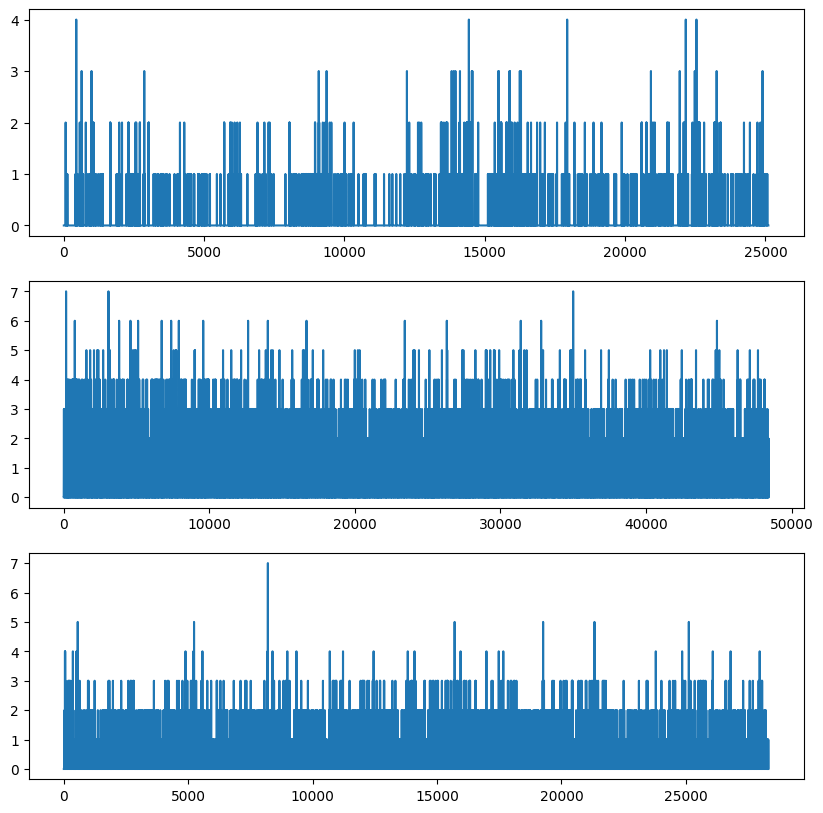

In [45]:
fig, axes = plt.subplots(3, 1, figsize=(10, 10))
axes[0].plot([len(cocycle) for cocycle in subj1_cocycles])
axes[1].plot([len(cocycle) for cocycle in subj2_cocycles])
axes[2].plot([len(cocycle) for cocycle in subj3_cocycles])

In [47]:
def get_items_flat(data):
    items = []
    items_flat = []
    for cocycle in data:
        items.append([])
        items_flat.append([])
        for item in cocycle:
            items[-1].append(numpy.unique(item))
            items_flat[-1].extend(numpy.unique(item))
        items_flat[-1] = numpy.unique(items_flat[-1])
    return items_flat

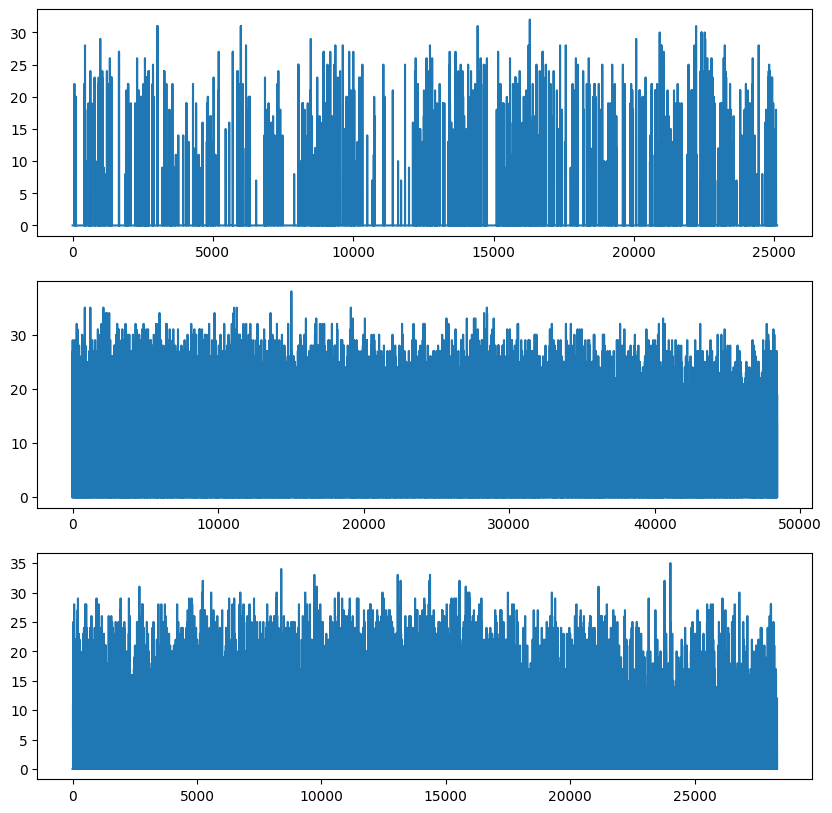

In [ ]:
def plot_items(ax, data):
    ax.plot([len(cocycle) for cocycle in get_items_flat(data)])

fig, axes = plt.subplots(3, 1, figsize=(10, 10))
plot_items(axes[0], subj1_cocycles)
plot_items(axes[1], subj2_cocycles)
plot_items(axes[2], subj3_cocycles)

In [49]:
fig, axes = plt.subplots(1, 3, figsize = (30, 1000))

items_flat = get_items_flat(subj1_cocycles)
vis = numpy.zeros((len(items_flat), 38))
for i in range(len(items_flat)):
    if len(items_flat[i]) != 0:
        vis[i, items_flat[i]] = True
axes[0].imshow(vis)

items_flat = get_items_flat(subj2_cocycles)
vis = numpy.zeros((len(items_flat), 38))
for i in range(len(items_flat)):
    if len(items_flat[i]) != 0:
        vis[i, items_flat[i]] = True
axes[1].imshow(vis)

items_flat = get_items_flat(subj3_cocycles)
vis = numpy.zeros((len(items_flat), 38))
for i in range(len(items_flat)):
    if len(items_flat[i]) != 0:
        vis[i, items_flat[i]] = True
axes[2].imshow(vis)

plt.gcf().savefig("res.svg")

In [51]:
all_features = dissimilarity_features[[col for col in dissimilarity_features.columns if col.startswith("dissim-5")]]

In [54]:
features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
features = pandas.DataFrame(features, columns = all_features.columns)
features

,dissim-5 betti dim-1 max,dissim-5 betti dim-1 mean,dissim-5 betti dim-1 std,dissim-5 betti dim-1 sum,dissim-5 betti dim-1 percentile-25,dissim-5 betti dim-1 median,dissim-5 betti dim-1 percentile-75,dissim-5 betti dim-1 kurtosis,dissim-5 betti dim-1 skew,dissim-5 betti dim-1 norm-1,...,dissim-5 bd2 dim-5 mean,dissim-5 bd2 dim-5 std,dissim-5 bd2 dim-5 sum,dissim-5 bd2 dim-5 percentile-25,dissim-5 bd2 dim-5 median,dissim-5 bd2 dim-5 percentile-75,dissim-5 bd2 dim-5 kurtosis,dissim-5 bd2 dim-5 skew,dissim-5 bd2 dim-5 norm-1,dissim-5 bd2 dim-5 norm-2
0,0.357259,0.0,0.617306,0.0,0.0,0.0,0.0,-0.408514,-0.595207,0.660468,...,1.705404,-0.192045,0.946213,1.707849,1.705423,1.702945,0.261192,-0.01047,0.946213,1.376765
1,0.357259,0.0,-0.644582,0.0,0.0,0.0,0.0,2.058036,0.866795,-1.458787,...,1.814824,-0.192045,1.015398,1.817388,1.814844,1.812247,0.261192,-0.01047,1.015398,1.469490
2,1.861627,0.0,1.469701,0.0,0.0,0.0,0.0,0.177977,0.584229,1.508170,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
3,0.357259,0.0,1.056861,0.0,0.0,0.0,0.0,-0.850180,0.309053,1.508170,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
4,-1.147108,0.0,-0.936504,0.0,0.0,0.0,0.0,-0.963487,-0.097947,-0.611085,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,0.357259,0.0,-0.105863,0.0,0.0,0.0,0.0,-0.738746,0.616033,0.236617,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
2013,-1.147108,0.0,-0.936504,0.0,0.0,0.0,0.0,0.396198,-1.249120,-1.034936,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
2014,-1.147108,0.0,-0.368476,0.0,0.0,0.0,0.0,-0.455871,-0.921659,-0.187234,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999
2015,1.861627,0.0,1.667508,0.0,0.0,0.0,0.0,0.156401,0.216570,1.508170,...,-0.560044,-0.192045,-0.486210,-0.560038,-0.560043,-0.560045,0.261192,-0.01047,-0.486210,-0.542999


### Results

#### Estimator

In [55]:
def analyze(all_features: pandas.DataFrame, n_components: int, folder: str):
    folder = f"{subj}/{exp}/results/{folder}"
    os.makedirs(folder, exist_ok = True)

    # Scale features
    all_features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    print(all_features.shape)
    numpy.save(f"{folder}/all_features.npy", all_features)
    numpy.savetxt(f"{folder}/all_features_shape.txt", all_features.shape)

    # PCA
    pca = sklearn.decomposition.PCA(n_components = n_components, svd_solver = "full", random_state = 42)
    pca_features = pca.fit_transform(all_features)
    print(pca_features.shape)
    numpy.save(f"{folder}/pca_features.npy", pca_features)
    numpy.savetxt(f"{folder}/pca_features_shape.txt", pca_features.shape)
    
    print('Explained variance', round(pca.explained_variance_ratio_.sum(), 2))
    print([ round(x, 3) for x in pca.explained_variance_ratio_ ])
    numpy.savetxt(f"{folder}/explained_variance.txt", [ pca.explained_variance_ratio_.sum() ])
    numpy.savetxt(f"{folder}/explained_variance_ratios.txt", pca.explained_variance_ratio_)

    # SDA
    sda = SDA.SDA(n_jobs = -1, scale = False, verbose = True)
    results, df_st_edges = sda.apply(pca_features)
    
    metrics = [ ]
    for row in tqdm.tqdm(results['St_edges']):
        metrics.append(SDA.clustquality.cluster_metrics_ground(edges_true, row))
    results = pandas.concat([ results, pandas.DataFrame(metrics) ], axis = 1)
    
    results.to_csv(f"{folder}/results.csv")
    df_st_edges.to_csv(f"{folder}/df_st_edges.csv")

    # Analyze
    best_results = SDA.analytics.best_results(results, key = 'Avg-Silh')
    best_results.to_csv(f"{folder}/best_results.csv")
    
    best_result = SDA.analytics.best_result(results, key = 'Avg-Silh', n_stages = N_STAGES)
    best_result_df = pandas.DataFrame([ best_result ])
    best_result_df.to_csv(f"{folder}/best_result.csv")
    display(best_result_df)
    
    best_edges = numpy.array(best_result['St_edges'])
    numpy.savetxt(f"{folder}/best_edges.txt", best_edges, fmt = "%d", newline = ' ')
    display(best_edges)

    stage_timing = SDA.analytics.stage_timing(best_edges, epochs)
    stage_timing.to_csv(f"{folder}/stage_timing.csv")
    display(stage_timing)
    
    SDA.analytics.plot_eeg_stages(raw_data, best_edges, epochs).savefig(f"{folder}/eeg_stages.svg")
    SDA.analytics.plot_stats(pca_features, epochs, best_result, df_st_edges).savefig(f"{folder}/stats.svg")

(2017, 453)
(2017, 15)
Explained variance 0.84
[0.212, 0.137, 0.097, 0.086, 0.077, 0.05, 0.035, 0.025, 0.024, 0.022, 0.021, 0.016, 0.015, 0.012, 0.011]
Applying to 2017 samples with 15 features each


100%|██████████| 1344/1344 [00:03<00:00, 361.99it/s]


,St_len_min,K_nb_max,N_cl_max,Cl_cen,Len_min,St_edges,N_stages,Longest_stage,Shortest_stage,Avg_stage_length,...,Cen_dist,Silh,Cal-Har,Dav-Bold,Avg-Silh,Avg-Cal-Har,Avg-Dav-Bold,AMI,ARI,FMI
0,20,45,20,Mode,40,"[0, 249, 549, 641, 1000, 1183, 1574, 1815, 2017]",8,391,92,252.125,...,2.057352,-0.0308,2.310815,24.388699,0.011362,1.47358,17.837985,0.730484,0.549182,0.613171


array([   0,  249,  549,  641, 1000, 1183, 1574, 1815, 2017])

,0,1,2,3,4,5,6,7
"Start-end time, sec","(10.5, 296.5)","(298.5, 647.5)","(648.5, 757.5)","(758.5, 1176.5)","(1177.5, 1398.5)","(1399.5, 1854.5)","(1855.5, 2124.5)","(2125.5, 2345.5)"
"Time length, sec",286.0,349.0,109.0,418.0,221.0,455.0,269.0,220.0
Number of epochs,249,300,92,359,183,391,241,202


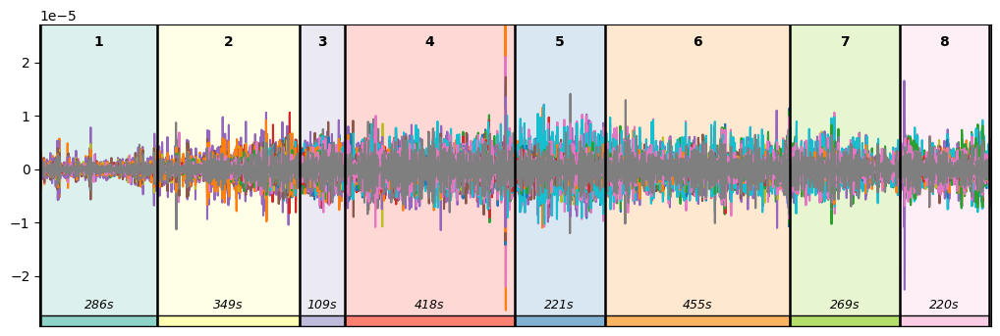

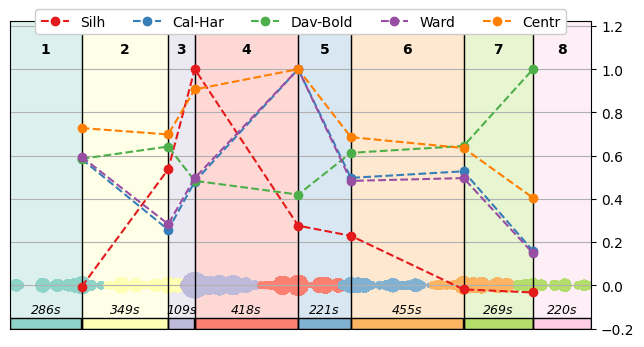

In [56]:
analyze(features, 15, "explore")

### Information value

In [19]:
result_edges = numpy.loadtxt(f"{subj}/{exp}/results/best_topological/best_edges.txt").astype(numpy.int32)
print(result_edges)

if os.path.exists(f"{subj}/{exp}/IV/IV.csv"):
    ivs = pandas.read_csv(f"{subj}/{exp}/IV/IV.csv")
else:
    _, labels = SDA.stageprocess.form_stage_bands(result_edges)
    ivs = SDA.analytics.IV.calc_IV_clust(features, labels)

    os.makedirs(f"{subj}/{exp}/IV", exist_ok = True)
    ivs.to_csv(f"{subj}/{exp}/IV/IV.csv", index = False)

ivs["normalized_iv"] = sklearn.preprocessing.MinMaxScaler().fit_transform(ivs[["IV"]])
display(ivs)

[   0  372  542  646  994 1116 1275 1795 2017]


IV: 100%|██████████| 19143/19143 [01:21<00:00, 234.78it/s]


,Feature,IV,IVs,normalized_iv
0,channel-0 betti dim-1 max,0.089330,"[0.1945697834610958, 0.07007211689932236, 0.10...",0.078413
1,channel-0 betti dim-1 mean,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.000000
2,channel-0 betti dim-1 std,0.085795,"[0.08661057918478648, 0.024214131138747996, 0....",0.075309
3,channel-0 betti dim-1 sum,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.000000
4,channel-0 betti dim-1 percentile-25,0.000000,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.000000
...,...,...,...,...
19138,overall bd2 dim-3 percentile-75,0.935723,"[2.9409523592704634, 0.21168841424686397, 0.53...",0.821360
19139,overall bd2 dim-3 kurtosis,0.062527,"[0.04017676321076237, 0.050860942128424715, 0....",0.054885
19140,overall bd2 dim-3 skew,0.099102,"[0.1662357408690293, 0.1351871429224981, 0.088...",0.086990
19141,overall bd2 dim-3 norm-1,0.128247,"[0.02067839329937159, 0.20877235522570453, 0.0...",0.112573


In [20]:
iv_qsda_scores = scores.join(ivs, lsuffix = "name", rsuffix = "Feature")
iv_qsda_scores = iv_qsda_scores[["name", "unique_values", "score", "normalized_score", "IV", "normalized_iv"]]

iv_qsda_scores["score"] = iv_qsda_scores["score"] * (iv_qsda_scores["unique_values"] >= UNIQUE_VALUES_THRESHOLD)
iv_qsda_scores["normalized_score"] = iv_qsda_scores["normalized_score"] * (iv_qsda_scores["unique_values"] >= UNIQUE_VALUES_THRESHOLD)

iv_qsda_scores = iv_qsda_scores.sort_values(by = 'score', ascending = False)
iv_qsda_scores["QSDA_IDX"] = numpy.arange(1, iv_qsda_scores.shape[0] + 1)

iv_qsda_scores = iv_qsda_scores.sort_values(by = 'IV', ascending = False)
iv_qsda_scores["IV_IDX"] = numpy.arange(1, iv_qsda_scores.shape[0] + 1)

iv_qsda_scores["IDX_DIFF"] = iv_qsda_scores["QSDA_IDX"] - iv_qsda_scores["IV_IDX"]

iv_qsda_scores = iv_qsda_scores.sort_index()
display(iv_qsda_scores)

,name,unique_values,score,normalized_score,IV,normalized_iv,QSDA_IDX,IV_IDX,IDX_DIFF
0,channel-0 betti dim-1 max,25,0.000000,0.000000,0.089330,0.078413,19143,6012,13131
1,channel-0 betti dim-1 mean,1,0.000000,0.000000,0.000000,0.000000,18983,16891,2092
2,channel-0 betti dim-1 std,421,0.449305,0.076182,0.085795,0.075309,8419,6200,2219
3,channel-0 betti dim-1 sum,1,0.000000,0.000000,0.000000,0.000000,16024,17711,-1687
4,channel-0 betti dim-1 percentile-25,1,0.000000,0.000000,0.000000,0.000000,16025,17712,-1687
...,...,...,...,...,...,...,...,...,...
19138,overall bd2 dim-3 percentile-75,2013,1.310514,0.222205,0.935723,0.821360,2336,30,2306
19139,overall bd2 dim-3 kurtosis,1963,0.806738,0.136787,0.062527,0.054885,4653,8847,-4194
19140,overall bd2 dim-3 skew,1979,0.252996,0.042897,0.099102,0.086990,11587,5603,5984
19141,overall bd2 dim-3 norm-1,2013,0.264090,0.044778,0.128247,0.112573,11367,4764,6603


<Axes: >

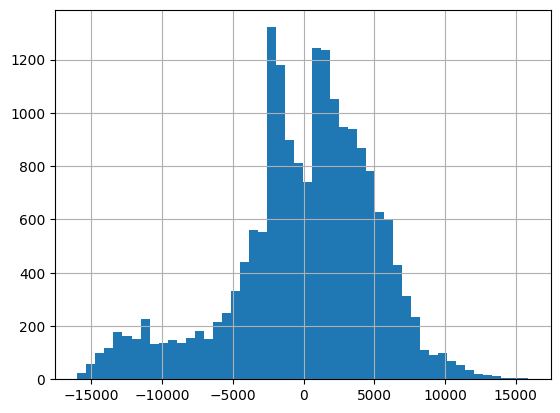

In [21]:
iv_qsda_scores["IDX_DIFF"].hist(bins = 50)

In [22]:
def vec_div(vec):
    mat1 = numpy.repeat(vec.reshape(-1, 1), repeats = len(vec), axis = 1)
    mat2 = numpy.repeat(vec.reshape(1, -1), repeats = len(vec), axis = 0)
    return numpy.sign(mat1 - mat2)

qsda = vec_div(iv_qsda_scores["score"].to_numpy())
iv = vec_div(iv_qsda_scores["IV"].to_numpy())

correct = ((qsda == iv).sum() - iv_qsda_scores.shape[0]) / 2
incorrect = ((qsda != iv).sum() - iv_qsda_scores.shape[0]) / 2

print(correct / 1e6, incorrect / 1e6)

126.914028 56.2940535


In [23]:
def sourceFilter(row):
    if row['Source'].startswith('dissim'):
        return 'dissim'
    return row['Source']

iv_qsda_scores[["Source", "Algorithm", "Dimension", "Stat"]] = iv_qsda_scores['name'].str.split(' ', expand = True)
iv_qsda_scores["Source"] = iv_qsda_scores.apply(sourceFilter, axis = 1)
iv_qsda_scores.to_csv(f"{subj}/{exp}/IV/iv_qsda_scores.csv", index = False)

In [24]:
def SourceRenamer(initial: str) -> str:
    if initial == 'dissim':
        return 'Correlations analysis'
    if initial == 'overall':
        return 'Overall processing'
    ind = initial.find('-') + 1
    comp = int(initial[ind:])
    return f'Comp. {comp} (ch. {epochs.ch_names[comp]})'

def AlgorithmRenamer(row):
    return {
        'amplitude-betti-1':        'Betti amp. with p=1',
        'amplitude-betti-2':        'Betti amp. with p=2',

        'amplitude-bottleneck':     'Bottleneck amp.',
        'amplitude-wasserstein-1':  'Wasserstein amp. with p=1',
        'amplitude-wasserstein-2':  'Wasserstein amp. with p=2',
        
        'amplitude-landscape-1-1':  'Pers. landscape amp. with p=1',
        'amplitude-landscape-1-2':  'Pers. landscape amp. with p=1',
        'amplitude-landscape-2-1':  'Pers. landscape amp. with p=2',
        'amplitude-landscape-2-2':  'Pers. landscape amp. with p=2',
        
        'amplitude-silhouette-1-1': 'Pers. silhouette amp. with p=1',
        'amplitude-silhouette-1-2': 'Pers. silhouette amp. with p=1',
        'amplitude-silhouette-2-1': 'Pers. silhouette amp. with p=2',
        'amplitude-silhouette-2-2': 'Pers. silhouette amp. with p=2',

        'bd2':                      'Stat. char. of (b + d) / 2',
        'life':                     'Stat. char. of lifetimes',
        'betti':                    'Stat. char. of Betti curves',
        'landscape':                'Stat. char. of pers. landscape',
        'silhouette-1':             'Stat. char. of lvl 1 pers. silh.',
        'silhouette-2':             'Stat. char. of lvl 2 pers. silh.',
        
        'entropy':                  'Persistence entropy',
        'numberofpoints':           'Number of points',
    }[row]

def DimensionRenamer(row):
    return {
        'all':        'All',
        'dim-1':      'Dimension 1',
        'dim-2':      'Dimension 2',
        'dim-3':      'Dimension 3',
        'dim-4':      'Dimension 4',
        'dim-5':      'Dimension 5',
        'norm-1':     'Amplitude norm with p=1',
        'norm-2':     'Amplitude norm with p=2',
    }[row]

def StatRenamer(row):
    return {
        'kurtosis':      'Kurtosis',
        'skew':          'Skew',
        'max':           'Maximum',
        'mean':          'Mean',
        'median':        'Median',
        'norm-1':        'Norm with p=1',
        'norm-2':        'Norm with p=2',
        'percentile-25': 'Percentile - 25',
        'percentile-75': 'Percentile - 75',
        'std':           'Standard deviation',
        'sum':           'Sum',
    }[row]

def make_stats(data: pandas.DataFrame, group_by: str, sort_by: str):
    stats = data.groupby(by = group_by).mean(numeric_only = True)
    stats = stats.sort_values(by = sort_by).reset_index()
    stats.to_csv(f"{subj}/{exp}/IV/stats_{group_by}_{sort_by}.csv", index = False)
    return stats

def draw(
    data: pandas.DataFrame,
    group_by: str,
    sort_by: str,
    ax,
    renamer: typing.Callable[[str], str],
    title: str
):
    stats = make_stats(data, group_by, sort_by)
    stats[group_by] = stats[group_by].apply(renamer)
    stats.plot.barh(x = group_by, y = sort_by, ax = ax, xlim = (2 * stats[sort_by].min() / 3, None))

    ax.set_title(title)
    ax.get_legend().remove()
    ax.xaxis.set_label_text('')
    ax.yaxis.set_label_text('')

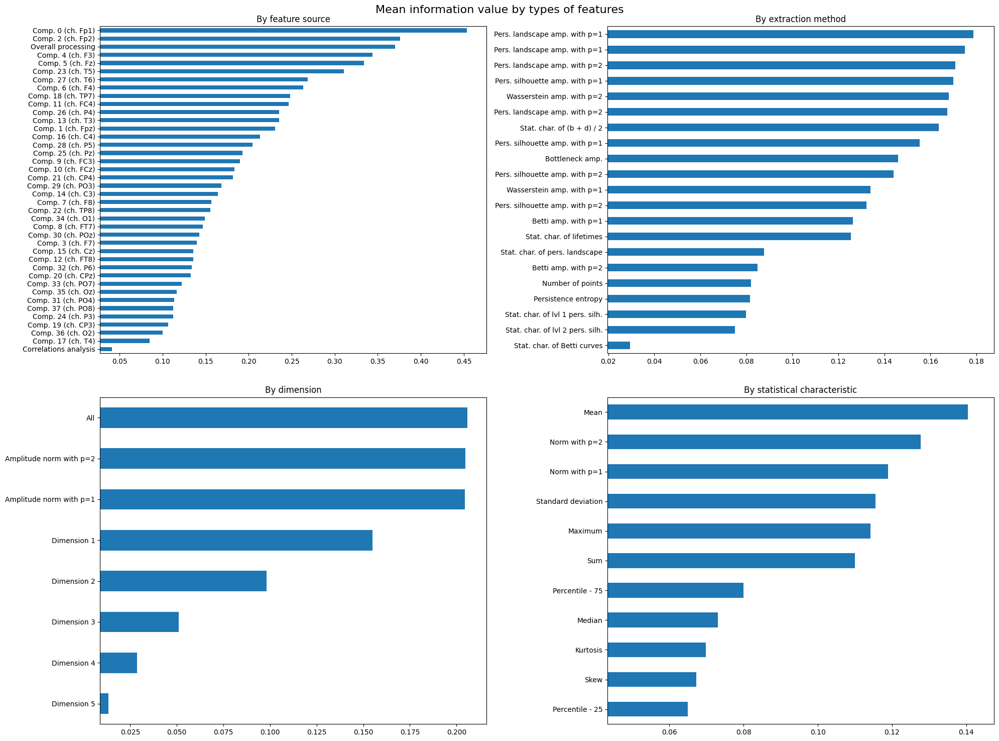

In [25]:
fig, axes = plt.subplots(2, 2, figsize = (20, 15))
fig.suptitle('Mean information value by types of features', fontsize = 16)

draw(iv_qsda_scores, 'Source', 'IV', axes.flat[0], SourceRenamer, 'By feature source')
draw(iv_qsda_scores, 'Algorithm', 'IV', axes.flat[1], AlgorithmRenamer, 'By extraction method')
draw(iv_qsda_scores, 'Dimension', 'IV', axes.flat[2], DimensionRenamer, 'By dimension')
draw(iv_qsda_scores, 'Stat', 'IV', axes.flat[3], StatRenamer, 'By statistical characteristic')

fig.tight_layout(h_pad = 3)
fig.savefig(f"{subj}/{exp}/IV/feature_agg_by_iv.svg")
fig.savefig(f"{subj}/{exp}/IV/feature_agg_by_iv.png")

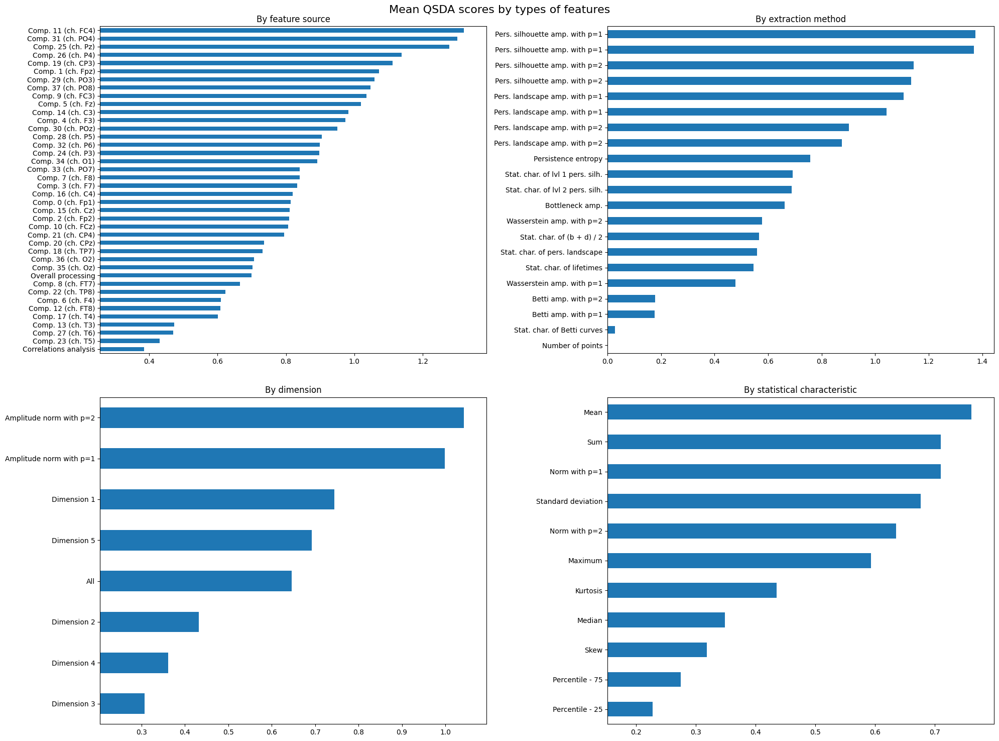

In [26]:
fig, axes = plt.subplots(2, 2, figsize = (20, 15))
fig.suptitle('Mean QSDA scores by types of features', fontsize = 16)

draw(iv_qsda_scores, 'Source', 'score', axes.flat[0], SourceRenamer, 'By feature source')
draw(iv_qsda_scores, 'Algorithm', 'score', axes.flat[1], AlgorithmRenamer, 'By extraction method')
draw(iv_qsda_scores, 'Dimension', 'score', axes.flat[2], DimensionRenamer, 'By dimension')
draw(iv_qsda_scores, 'Stat', 'score', axes.flat[3], StatRenamer, 'By statistical characteristic')

fig.tight_layout(h_pad = 3)
fig.savefig(f"{subj}/{exp}/IV/feature_agg_by_qsda.svg")
fig.savefig(f"{subj}/{exp}/IV/feature_agg_by_qsda.png")

In [28]:
def draw_sources_heatmap(data: pandas.DataFrame, sort_by: str):
    svg = open("report/regions/regions.svg", "r").read()
    svg = svg[svg.find('>') + 1:svg.rfind('<') - 1]
    defs = ""

    stats = make_stats(data, "Source", sort_by)[["Source", sort_by]]
    stats = stats[stats.apply(lambda row: row['Source'].startswith('channel-'), axis = 1)]

    min, max = stats[sort_by].min(), stats[sort_by].max()
    colors = [[ 1, 0.25, 0 ], [ 1, 0.66, 0 ], [ 1, 0.75, 0 ], [ 0.66, 0.8, 0 ], [ 0.25, 1, 0 ]]
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list('rg', colors, N = int((max - min) * 1000))

    for _, row in stats.iterrows():
        score = int((row[sort_by] - min) * 1000)
        color = matplotlib.colors.rgb2hex(cmap(score))

        id = int(row['Source'][row['Source'].find('-') + 1:])
        id_index = svg.index(f'id="{id}"')
        path_start = svg.rfind("<", 0, id_index)
        path_end = svg.find(">", id_index)

        path = svg[path_start:path_end+1]
        m_idx = path.find("M")
        x = float(path[m_idx + 1:m_idx + 7])
        y = float(path[m_idx + 8:m_idx + 15])

        defs += f"""
            <radialGradient id="gradient{id}">
                <stop offset="0%" stop-color="{color}" stop-opacity="0.66"></stop>
                <stop offset="100%" stop-color="{color}" stop-opacity="0"></stop>
            </radialGradient>
        """
        part = f"""
            <circle cx="{x}" cy="{y - 2}" r="50" fill="url(#gradient{id})"></circle>
            {path.replace(f'id="{id}"', f'fill="{color}" stroke="{color}"')}
        """

        svg = svg[:path_start] + part + svg[path_end+1:]

    svg = f"""
        <svg viewBox="0 0 530 528" fill="none" xmlns="http://www.w3.org/2000/svg">
            <defs> {defs} </defs> {svg}
        </svg>
    """

    file = f"{subj}/{exp}/IV/{sort_by}_regions.svg"
    open(file, "w").write(svg)
    return IPython.display.SVG(file)

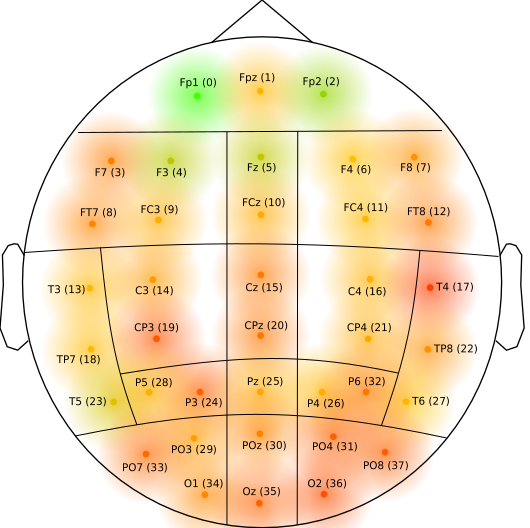

In [29]:
draw_sources_heatmap(iv_qsda_scores, "IV")

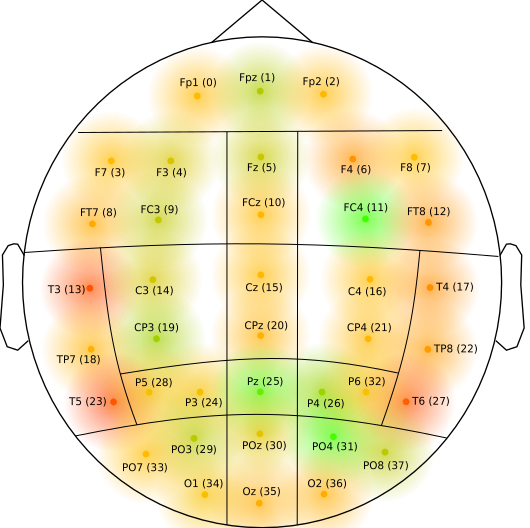

In [30]:
draw_sources_heatmap(iv_qsda_scores, "score")